## Reading the data

In [1]:
import pandas as pd
import numpy as np
from gensim.models.doc2vec import Doc2Vec, TaggedDocument
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE


df = pd.read_csv("../../corpus_sprint3_balanced_cleaned_all.csv", encoding="utf-8")
df = df.dropna()
print(df)
print(df.shape)

model = Doc2Vec.load("../../model_doc2vec_balanced_20epochs")

        Row No Date received                  Product  \
446       6874      09/09/16              Payday loan   
713      10840      08/07/15            Consumer Loan   
803      12248      08/07/16            Consumer Loan   
1153     17162      05/26/16            Consumer Loan   
1185     17642      11/05/15            Consumer Loan   
...        ...           ...                      ...   
126588  222826      09/21/16  Bank account or service   
126589  142174      03/05/16  Bank account or service   
126590   55888      01/23/17  Bank account or service   
126591  293505      09/27/16  Bank account or service   
126592  327087      09/28/15  Bank account or service   

                       Sub-product                                     Issue  \
446                           None  Charged fees or interest I didn't expect   
713                   Vehicle loan       Problems when you are unable to pay   
803                   Vehicle loan                Managing the loan or leas

In [2]:
df_concat = model.docvecs.vectors_docs

## One hot encoding and concatenating

In [3]:
vectors = model.docvecs.vectors_docs

In [4]:
one_hot = pd.Categorical(df['Issue'])
df_dummies = pd.get_dummies(one_hot)

v_df = pd.DataFrame(vectors)
df_concat = pd.concat([v_df, df_dummies], axis = 1)
print(df_concat.shape)

(58035, 141)


## Applying UMAP

In [5]:
import umap
data_reduced = umap.UMAP().fit_transform(df_concat)

C:\Users\l-Larsovic-l\anaconda3\lib\site-packages\umap\spectral.py:4: NumbaDeprecationWarning: No direct replacement for 'numba.targets' available. Visit https://gitter.im/numba/numba-dev to request help. Thanks!
  import numba.targets


In [6]:
print(data_reduced.shape)

(58035, 2)


## Applying k-means

In [7]:
from sklearn.cluster import KMeans
from sklearn import metrics

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49


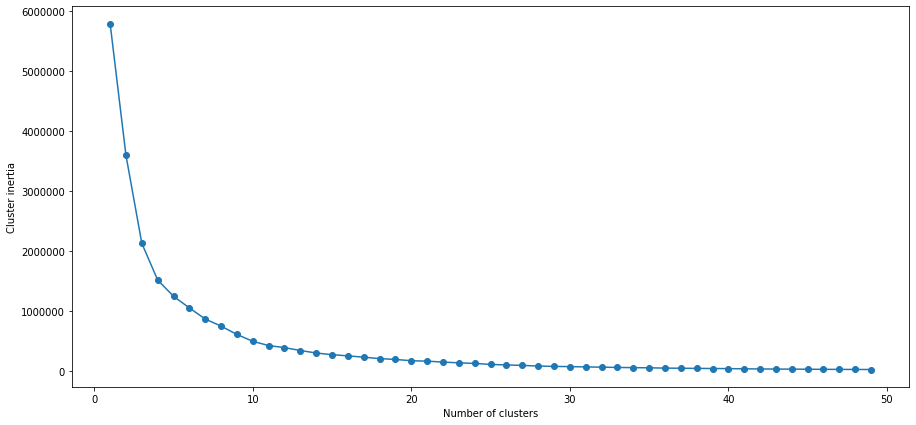

In [8]:
inertia = []
k_min=1
k_max=50
for i in range(k_min, k_max):
    print(i)
    km = KMeans(n_clusters=i,init='k-means++')
    km.fit(data_reduced)
    inertia.append(km.inertia_)
plt.rcParams['figure.figsize'] = [15,7]
plt.plot(range(k_min,k_max), inertia,marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Cluster inertia')
plt.show()

## Silhouette scores

For n_clusters = 4 The average silhouette_score is : 0.43074206
For n_clusters = 5 The average silhouette_score is : 0.41939208
For n_clusters = 6 The average silhouette_score is : 0.448316
For n_clusters = 7 The average silhouette_score is : 0.44878975
For n_clusters = 8 The average silhouette_score is : 0.46719325
For n_clusters = 9 The average silhouette_score is : 0.5070032
For n_clusters = 10 The average silhouette_score is : 0.53479904
For n_clusters = 11 The average silhouette_score is : 0.5351692
For n_clusters = 12 The average silhouette_score is : 0.5557342
For n_clusters = 13 The average silhouette_score is : 0.5627994
For n_clusters = 14 The average silhouette_score is : 0.5890792
For n_clusters = 15 The average silhouette_score is : 0.5893533
For n_clusters = 16 The average silhouette_score is : 0.61131126
For n_clusters = 17 The average silhouette_score is : 0.62381536
For n_clusters = 18 The average silhouette_score is : 0.63519204
For n_clusters = 19 The average silhoue

C:\Users\l-Larsovic-l\anaconda3\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


For n_clusters = 24 The average silhouette_score is : 0.6995312


C:\Users\l-Larsovic-l\anaconda3\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


For n_clusters = 25 The average silhouette_score is : 0.7096946


C:\Users\l-Larsovic-l\anaconda3\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


For n_clusters = 26 The average silhouette_score is : 0.72200567


C:\Users\l-Larsovic-l\anaconda3\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


For n_clusters = 27 The average silhouette_score is : 0.7317572


C:\Users\l-Larsovic-l\anaconda3\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


For n_clusters = 28 The average silhouette_score is : 0.74397045


C:\Users\l-Larsovic-l\anaconda3\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


For n_clusters = 29 The average silhouette_score is : 0.75315684


C:\Users\l-Larsovic-l\anaconda3\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


For n_clusters = 30 The average silhouette_score is : 0.76007885


C:\Users\l-Larsovic-l\anaconda3\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


For n_clusters = 31 The average silhouette_score is : 0.7678209


C:\Users\l-Larsovic-l\anaconda3\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


For n_clusters = 32 The average silhouette_score is : 0.77213246


C:\Users\l-Larsovic-l\anaconda3\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


For n_clusters = 33 The average silhouette_score is : 0.77922267


C:\Users\l-Larsovic-l\anaconda3\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


For n_clusters = 34 The average silhouette_score is : 0.78104556


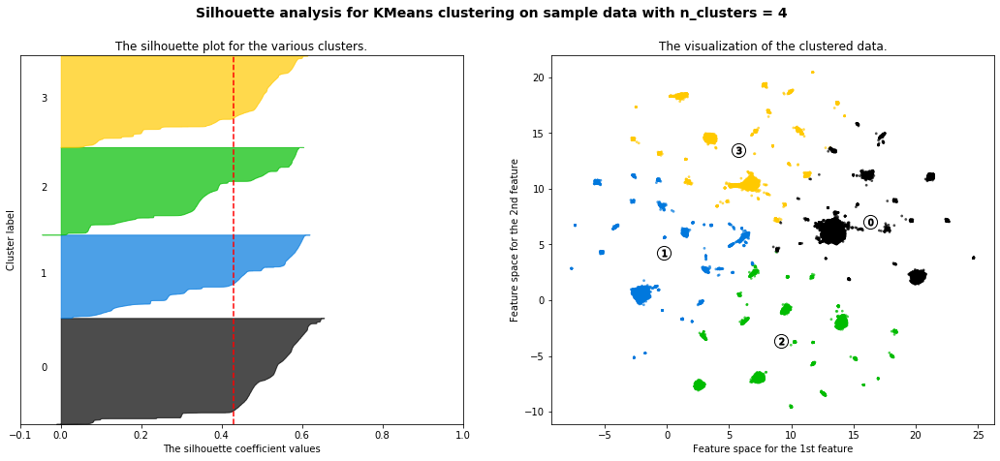

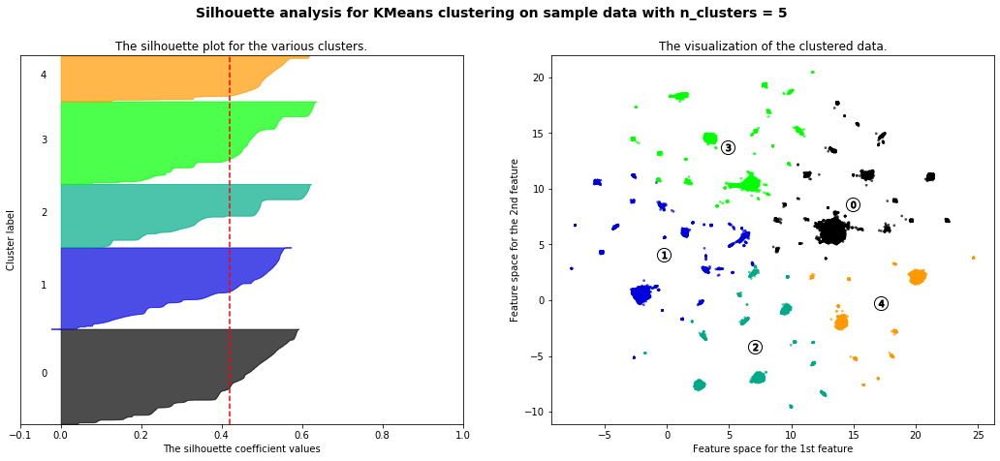

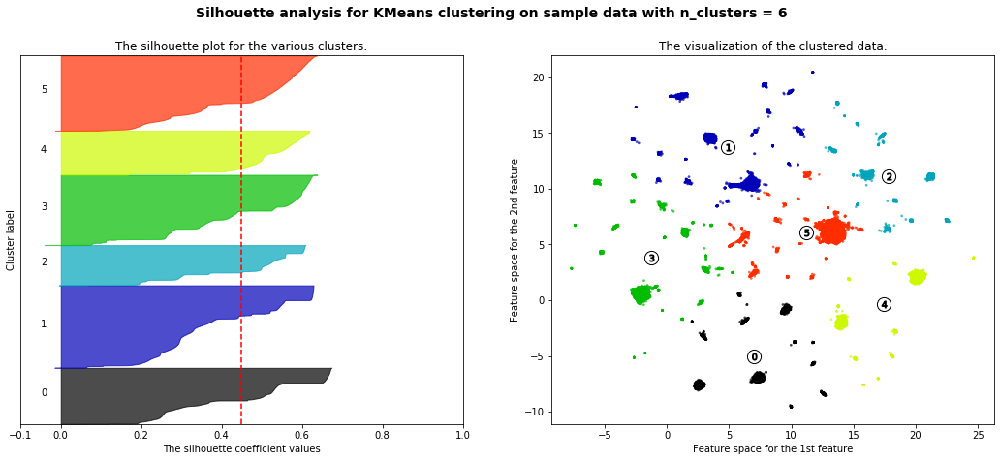

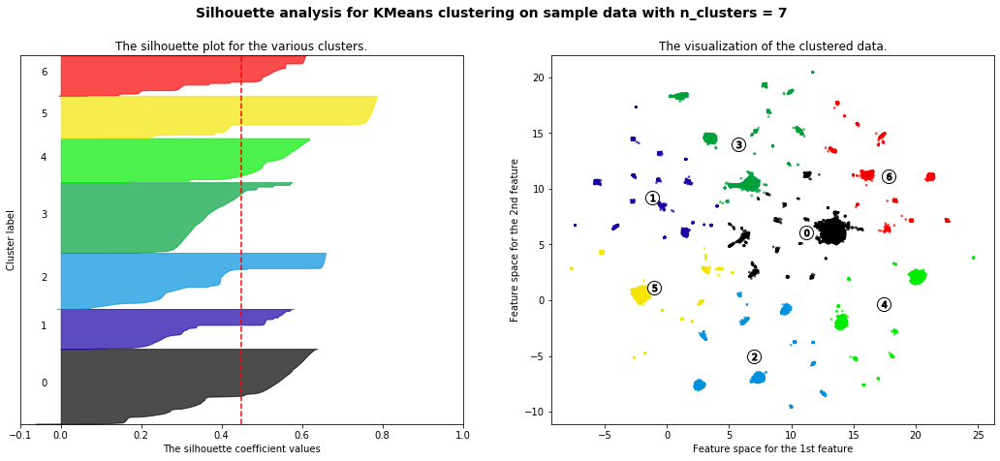

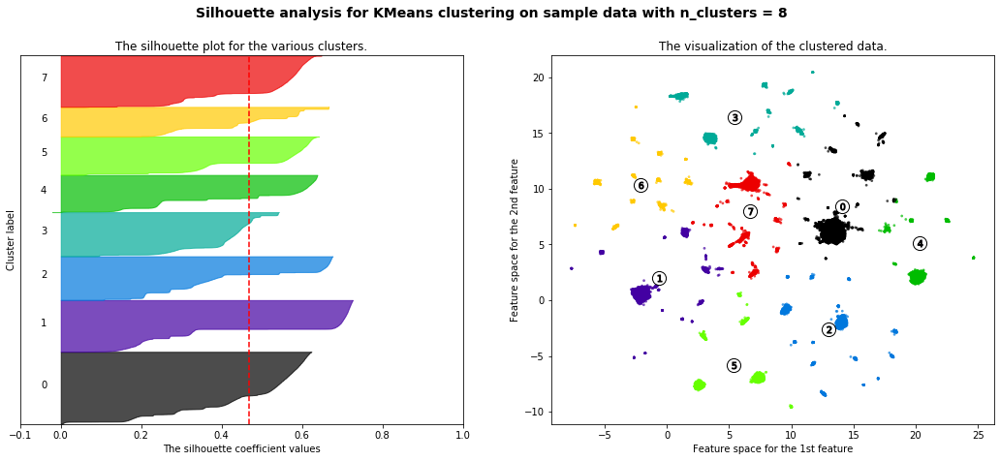

...

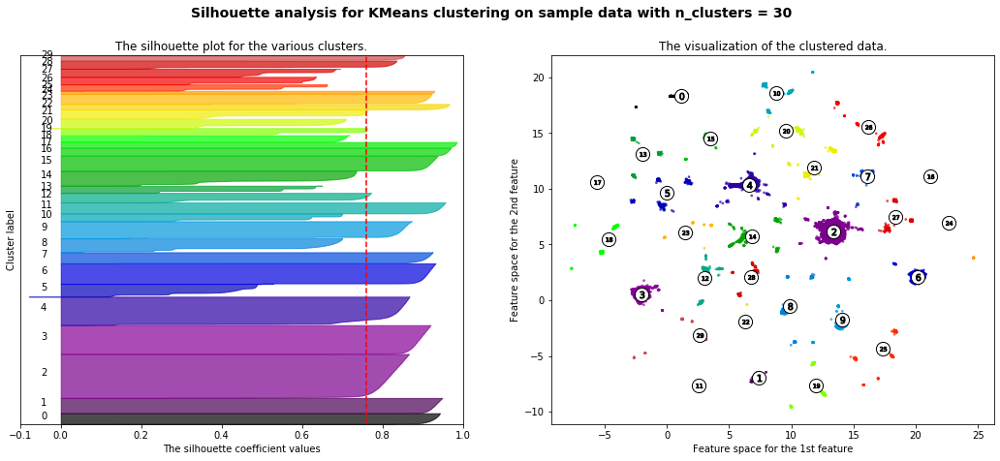

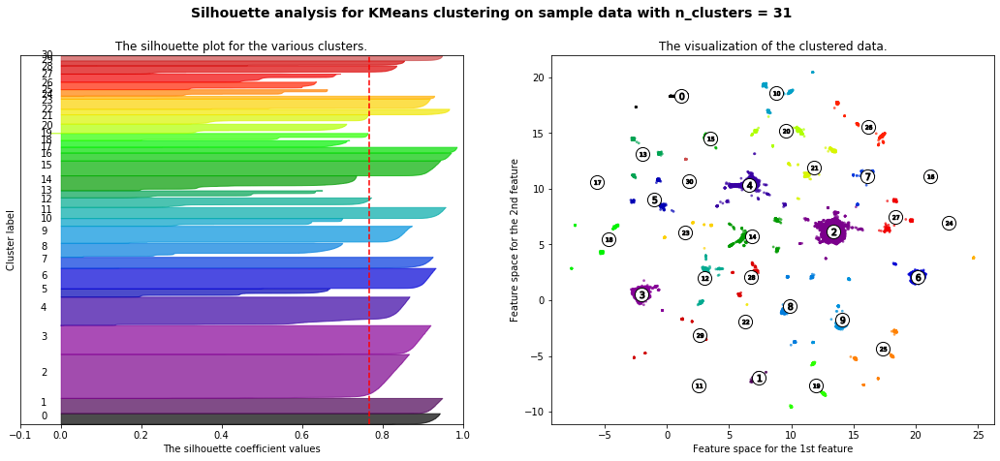

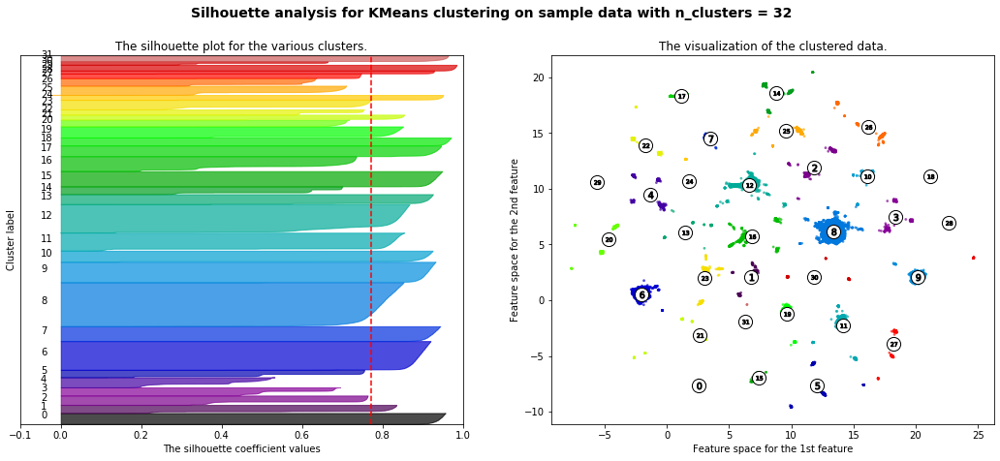

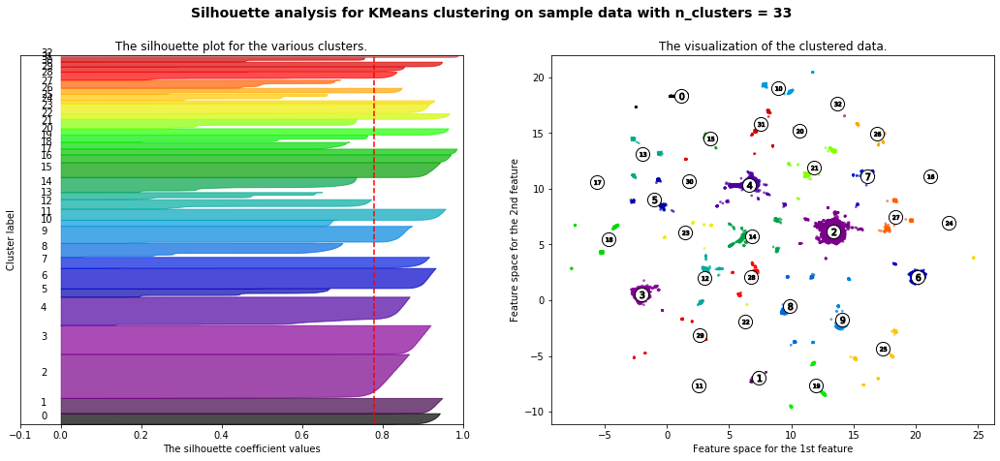

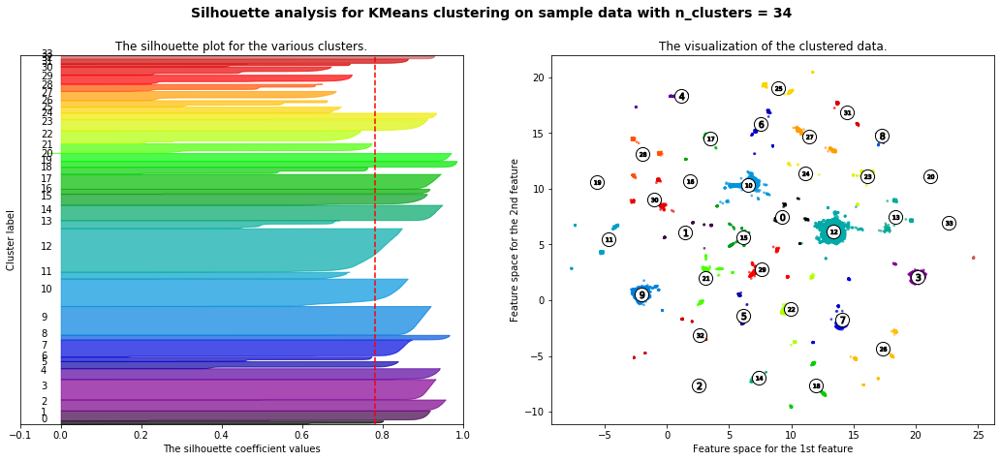

In [9]:
from sklearn.metrics import silhouette_samples, silhouette_score
import matplotlib.cm as cm

for n_clusters in range(4,35):
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(data_reduced) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(data_reduced)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(data_reduced, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(data_reduced, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(data_reduced[:, 0], data_reduced[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

plt.show()

## Analyzing with narrative

In [13]:
number_clusters = 37
km = KMeans(n_clusters=number_clusters,init='k-means++')
indexes = km.fit_predict(data_reduced)
centroids = km.cluster_centers_

df_index = pd.DataFrame(indexes)

indici = []
for i in range(0,len(indexes)):
    indici.append(i)
df1 = df_index.set_index(pd.Index(indici))
df2 = df.set_index(pd.Index(indici))
df_result = pd.concat([df1,df2], axis = 1)
print(df_result)

        0  Row No Date received                  Product  \
0      23    6874      09/09/16              Payday loan   
1      19   10840      08/07/15            Consumer Loan   
2       2   12248      08/07/16            Consumer Loan   
3       2   17162      05/26/16            Consumer Loan   
4       2   17642      11/05/15            Consumer Loan   
...    ..     ...           ...                      ...   
58030   1  222826      09/21/16  Bank account or service   
58031  12  142174      03/05/16  Bank account or service   
58032   1   55888      01/23/17  Bank account or service   
58033   6  293505      09/27/16  Bank account or service   
58034   1  327087      09/28/15  Bank account or service   

                      Sub-product                                     Issue  \
0                            None  Charged fees or interest I didn't expect   
1                    Vehicle loan       Problems when you are unable to pay   
2                    Vehicle loan         

Cluster number: 0
hello i keep receiving phone calls and letters from ditech financial for me to pay a loan i never obtained with them and they do not stop harrassing me 

at the beginning of we received news from our home builder that we would close on it on on friday we received from the builder s lending company a tax form to authorize them to obtain copies of our tax statements by monday we had found out that the form was being sent in too late to get copies and still make an close date we also found out that the documents we were requested to send in and that we promptly sent back at the beginning of were the last months of bank statements a copy of our hud form and the contact information for our insurance agent i had asked the representative to send me an email confirming receipt of the documents and she did on monday we found out that all of the documents we had turned over had not been turned over to the underwriters at and our loan sat for weeks with no attention to it and no

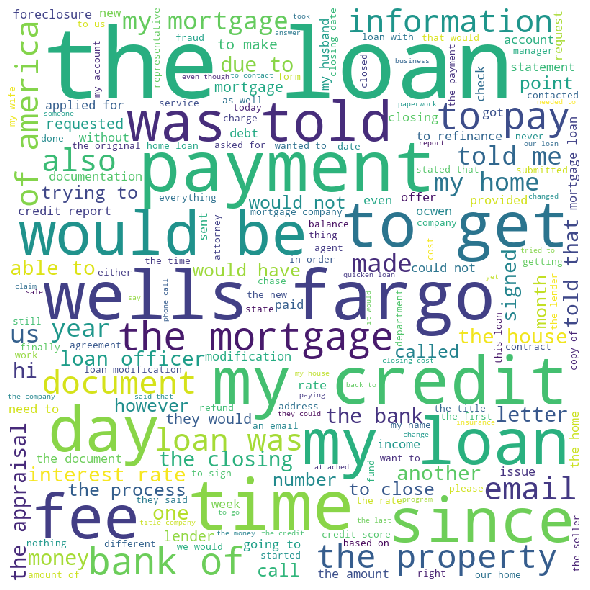

Cluster number: 1
dear sirmadam i am sending this complaint since citibank does n t honor the promotion offer on which citibank would post miles to my account after i opened a citigold account and finished some related requirements i opened the citigold checking on and fulfilled all the requirements on both the call center and online chat confirmed i had fulfilled all the requirements on on the online chat customer service stated that they need additional days to post the miles to my account i waited until and the security message customer service suddenly told me i was not targeted for the promotion after i had been waiting for much more than days when it was the time citibank need to honor the offer by their t c i sent a new online chat on and the customer service stated that they would file an investigation and i would receive the result after business days however there is no response at all until now 

i ve made multiple attempts to contact first merit bank to close out two cd s t

Number of entries: 4375


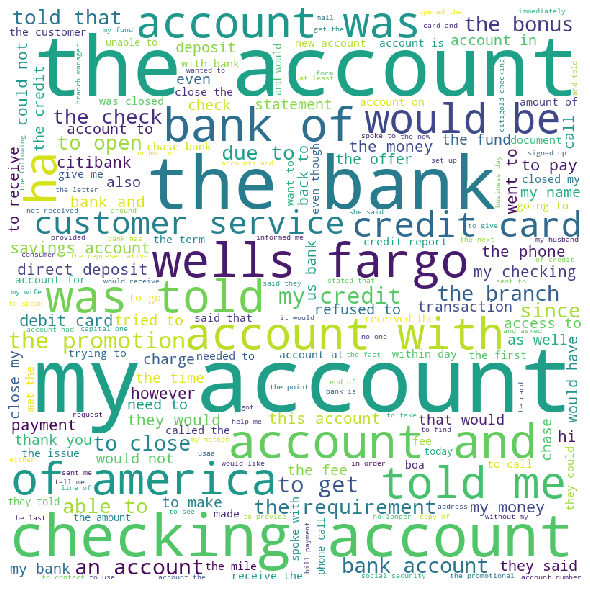

Cluster number: 2
i have day late marks on my credit report for and i reviewed my payment history with santander and noticed that i made payments in both and i called to get this corrected and they stated we do not do that in addition my account balance has only decreased by under since i got the loan back in santander could not give any detailed information as to why 

i had a car loan with santander consumer usa i made a payment of while in the process of trading that vehicle for a new vehicle my last statement had a estimate payoff of however that week the dealership payoff amount was not including the amount i had just paid i proceeded with the trade financed by i was told by the dealership the difference from the payment i made would be refunded to me since then i contacted santander usa after receiving a payoff statement they could not tell anything because the account was closed 

Number of entries: 4551


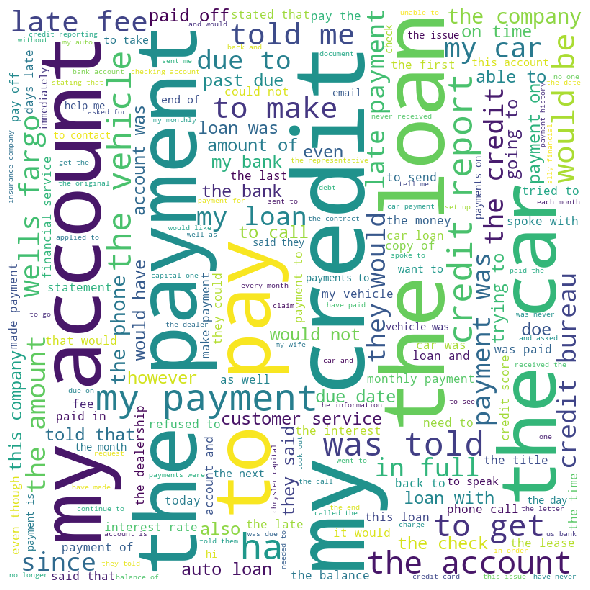

Cluster number: 3
i faxed information to this coimpany as well this account is a result of identity theft and is still being reported and collected on acct begining with 

i have no knowledge of the said debt and would like it removed as its reporting to the credit bureau as an open account and is negatively affecting me this information was also shared illegally with a third party without my consent 

on i pulled my credit report to see exactly what was listed on there i found a collection entry from convergent outsourcing with a date open date of on credit report and on others well i want this item to be removed from my credit report and i want the company to send me a letter stating that the collection item has been removed i have never had a account and i know it is n t mine because i was serving years in when this collection was put on my credit report so this is id fraud

Number of entries: 1755


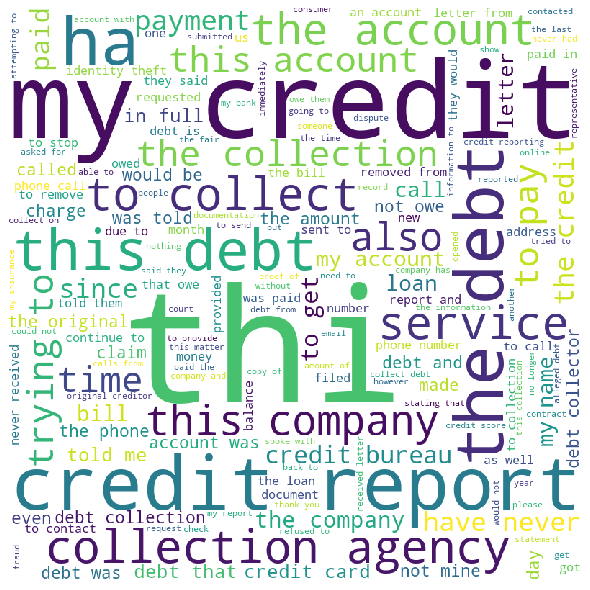

Cluster number: 4
i needed car repair was offered financing via as their financing option which i accepted upon picking up the vehicle i learned that the financing was at which is grossly high and very unfair to someone who needs the financing i want to complain that the financing charge is far too high and should be reduced to a fair rate of under they are taking advantage of the financially disadvantaged person who can otherwise pay off a loan and this is a rip off 

Number of entries: 1756


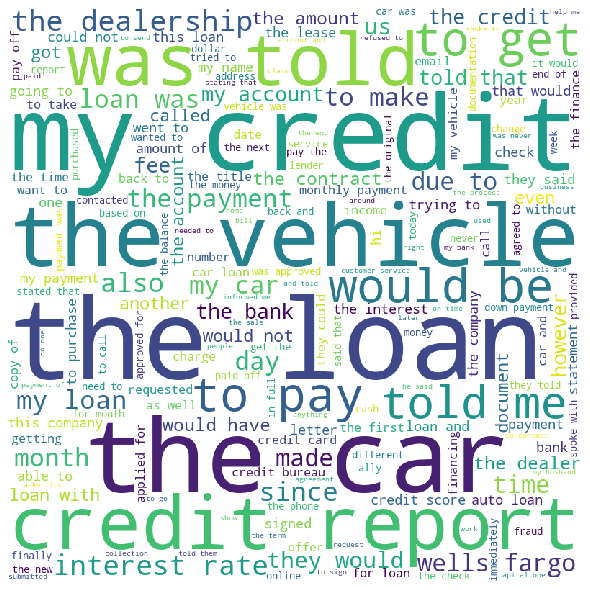

Cluster number: 5
i attended the university of at the time of registration i advised the enrollment department that i did not have my or i was told that it would be fine all to find out that none of the credits that i obtained are even valid because you can not get financial aid without being tested and or having a or once i found of about this i withdrew from the university of the school then sent the funds back to the government and placed my account in collections i have not been able to get this resolved and it has been almost years the university of has a for not applying funds from the government to accounts instead sending students to collections i would like to have my loan removed from my credit report

Number of entries: 3231


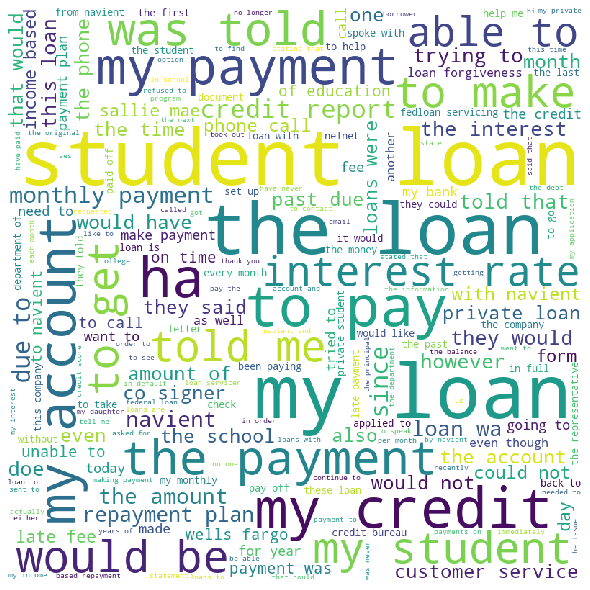

Cluster number: 6
received letter from citizens bank talking about a credit to my account because of errors in deposit amounts no dates or deposit amounts included in letter no way to tell if the amount credited is correct 

we are the on we found usages in notified the bank of america branch office here in they removed then there was with draw on same day after they canceled all cards next they move deposits after they subtract money from account makes overdrawn when you look again the transaction are gone correct this and return all monies back 

from to i had several problems with my employer s payroll company in where my payroll was deposited late thus causing my auto payments to overdraft at times my supervisor and i have supporting documentation to back this up in my payroll was not deposited again and i had a few nsf for some auto payments see exhibit a instead of contacting me or charging me nsf per day wells fargo kept hitting my account with one nsf fee after another to bette

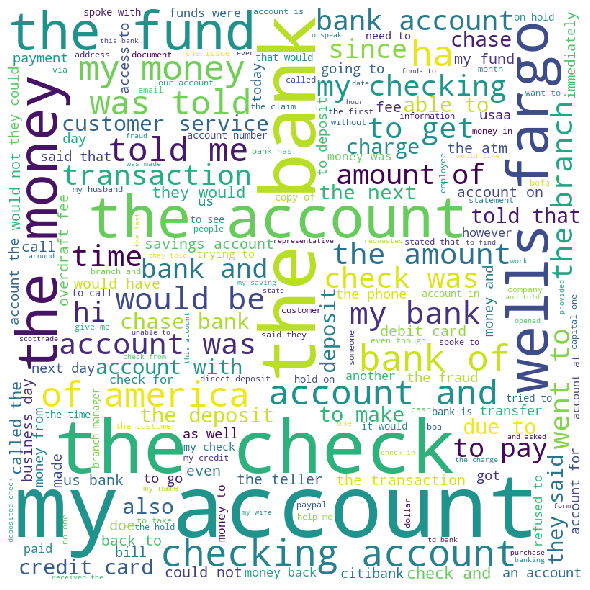

Cluster number: 7
the reason i am complaining against sage stream is because i have on several occasions requested for my file to be frozen and they have not frozen my file or responded to my request i need my file frozen 

i sent them a letter is regarding an account that i have not had note the attached document from the secretary of state of ohio i have no affiliation with this company its a business credit card processing application i sent them proof from secretary of states office attached 

experian is reporting on my credit report under a account that is not mine bank on i requested experian to validate this information with bank and provide me with copies of any documentation associated to this account bearing my signature see attached letter sent usps certified item number delivered on at see attached i again sent another letter to experian usps certified mail item number delivered on at see attached experian has failed to provide any documentation bearing my signature as per

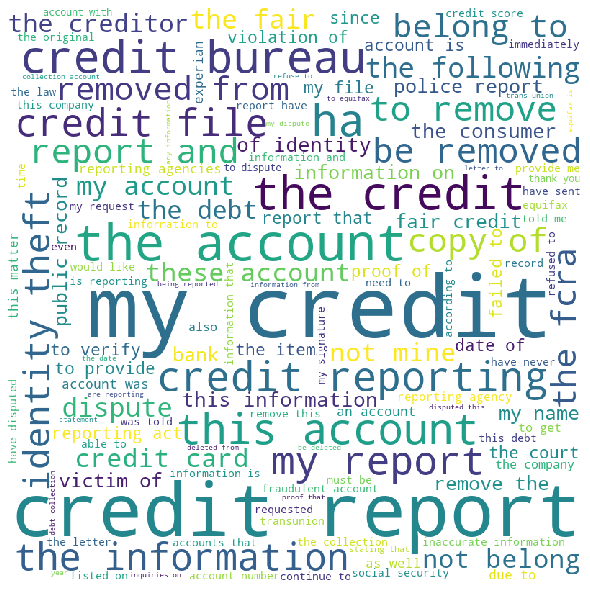

Cluster number: 8
Number of entries: 907


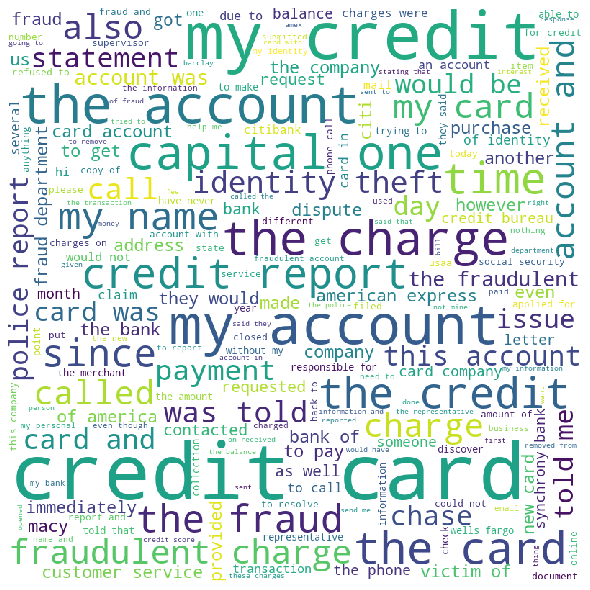

Cluster number: 9
Number of entries: 789


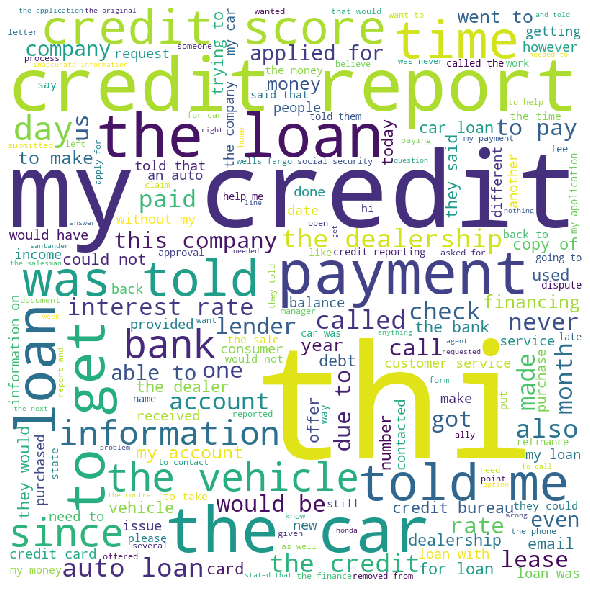

Cluster number: 10
transunion indicates i have a late payment that supposedly occurred months ago but that is not true i have disputed other credit reporting issues recently and it was only after i did so that my credit score dropped dramatically for no apparent reason i would like transunion to provide proof as to which particular account accounts i paid late within the past months 

the bank accounts are fraudulent account that belong to not account number and account number are the same accounts i have attached an incident report from police dept i have attached the signature page that was sent to cfpb from bank s application and i have sent my mortgage page with my signature you can plainly see the signatures do not match i never knew of this debt until discovering on credit report this debt from is not mine never had any affiliation with this account this account belongs to not i am asking for the fraudulent accounts to be removed immediately 

the bureau is reporting false inform

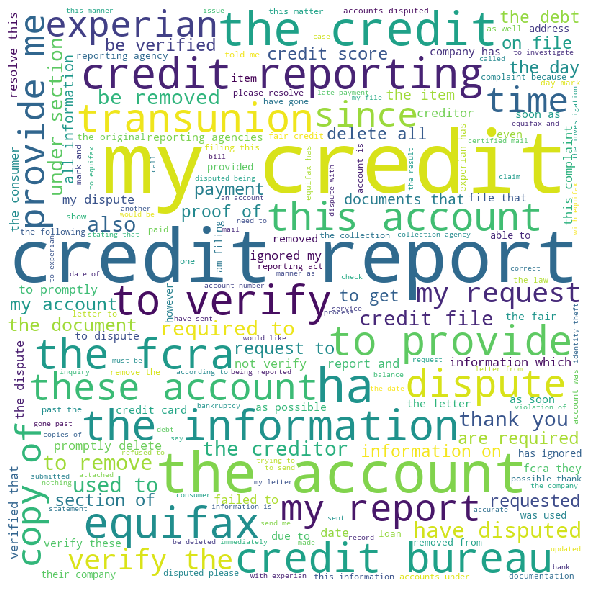

Cluster number: 11
even with a balance macy s credit citigroup charges a interest free each month they also participate in a residual interest scheme so even if you pay off your balance by your due date they will charge interest on that balance this is not explained or adequately disclosed 

despite my repeated requests to be removed from capital one s mailing list for credit card offers i keep getting them in the mail i have called left messages and talked to people with guarantees that i am off their list yet i keep getting them i am already on the non solicitation list with my credit report yet capital one keeps mailing me offers 

Number of entries: 1218


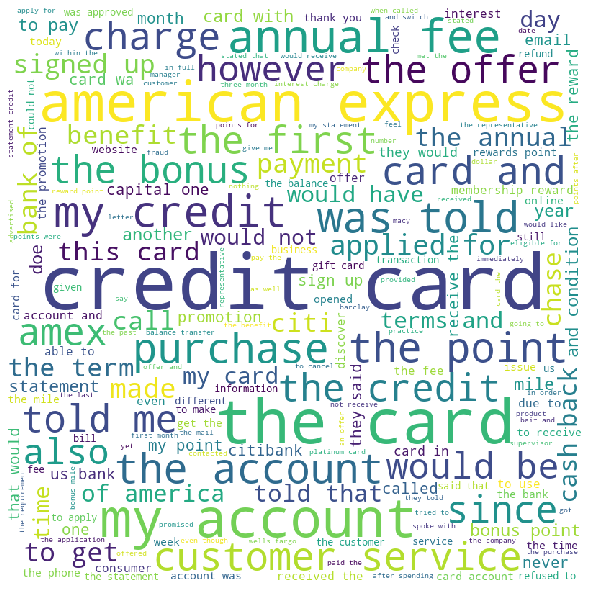

Cluster number: 12
my us bank debit and credit cards were stolen from in wa on i reported the theft immediately but there was already of fraudulent charges on the debit card the cards were cancelled but the account was still driven into the red there was only about in the account to begin with no one at the bank has been able to explain how the thieves withdrew so far over the limit i submitted a fraud claim to us bank to be refunded the stolen money i did n t hear anything until yesterday when i received a letter stating that my claim had been denied and i was responsible for the stolen money the letter said that if i had questions i could call and speak to a fraud prevention representative a day days a week this has not been the case i ve been on the phone for days trying to speak to a fraud representative they have never been available i ve been told my several people at us bank that fraud representatives did not take phone calls and they re unreachable i was promised by a superviso

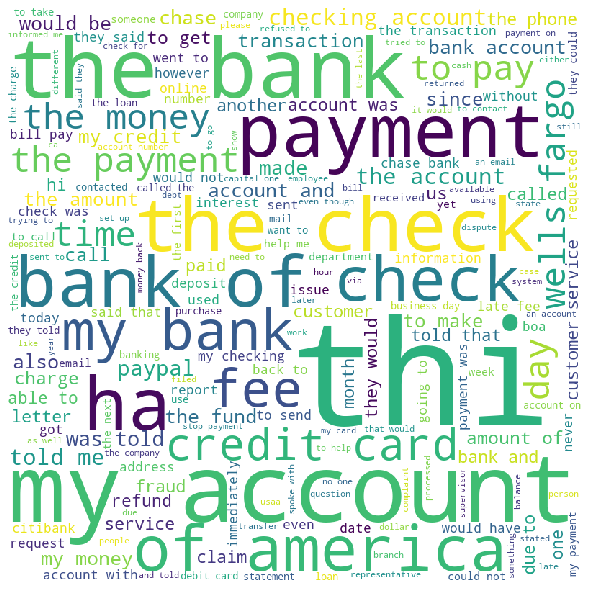

Cluster number: 13
hsbc mortgage has forced me into forclosure because they refused to do a modification on my loan as i went into a fixed income amount and was unable to afford the set mortgage payment i have been battling to save my house court after court the bank bought the house back in foreclosure and being that im in still battling in court i have paid over in escrow account i ve been trying to buy back my house and i have given all the information the bank has requested including bank statements and it was all a hoax and their just playing around with me and now their saying we refuse to sell to you i am almost years old and i have been living in this house for years i plan to die there please please i am begging someone to help me 

i originally applied for mortgage remediation in my request was denied in i applied for mortgage remediation again in i started making trial mortgage refinance payments on my mortgage was refinanced in and i returned the final signed documents on d

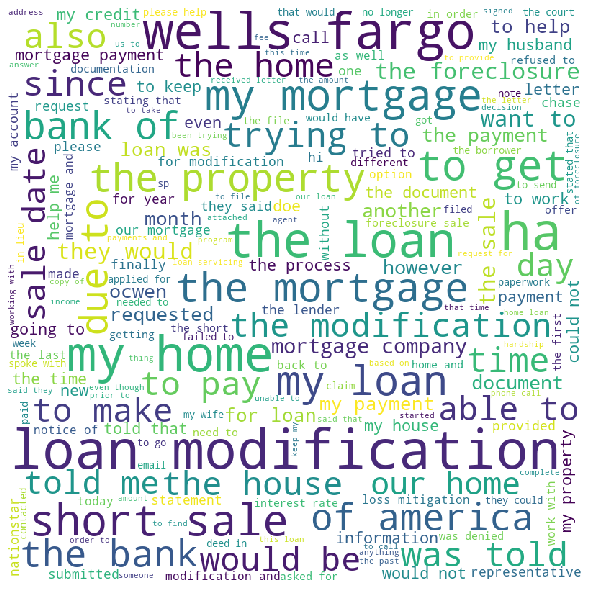

Cluster number: 14
i have a loan currently held by who purchased the loan from norcom my mortgage has never been late and is consistently paid three months in advance but the escrow is now in discrepancy for over let it be known that insurance and taxes are figured into the monthly loan amount bought the loan from norcom taking it over i received a check from for about for an overage in my escrow account i did n t cash it because later that month i received a letter of demand from the town demanding payment for a year of unpaid property taxes there was an obvious error and i did not want to compound it i got in touch with the town to confirm they had n t received the taxes and then contacted to resolve the issue paid the town taxes i then received a letter from stating that my escrow account has a shortage i contacted to dispute and was told that it was not their issue and i had to take the issue up with norcom i contacted norcom and norcom stated that they were not responsible because

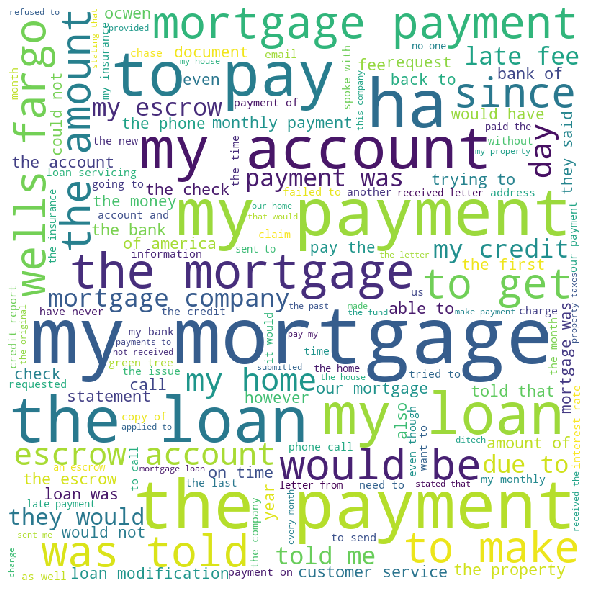

Cluster number: 15
hello i have a loan serviced through that is a private student loan it is current however the loan was sold and re sold from to to bank and is back at the law office of john bonewicz persists in calling my friends parents to get in touch with me i have never resided at this address or provided this phone number as a contact number they refuse to acknowledge that they called my friend s parents number a number which i do n t even know when i called to indicate they should delete all contact numbers aside from my cell phone they refused to do so unless i acknowledged that i owed them a debt i do not in fact owe them a debt as my loan is current and serviced by when i spoke with they indicated that they never authorize rd party collection calls i d like to know how to get them to stop calling thanks 

Number of entries: 1243


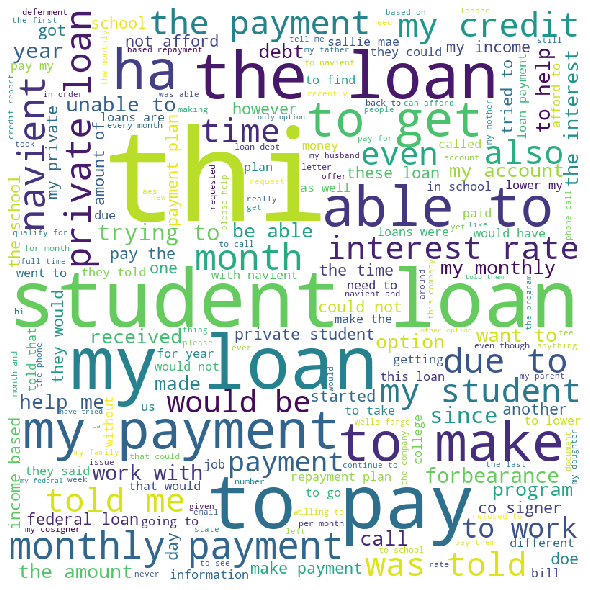

Cluster number: 16
Number of entries: 316


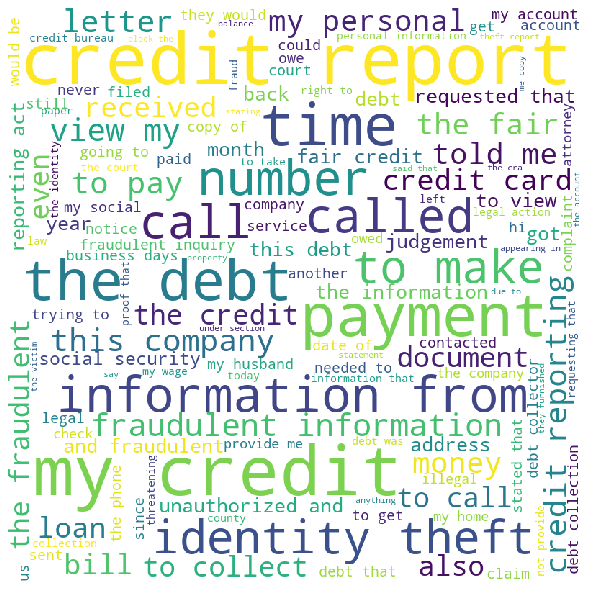

Cluster number: 17
on i accessed xoom com with the intent of transferring from my account to a account held by a after i input all required information for this transfer i was sent an email notifying me the funds should be available to my friend on shortly thereafter on the same day i was asked to verify additional information which i did immediately i received a text message from xoom the morning of stating my transfer to was sent to transferred however later than morning i receive a email message from xoom stating we re sorry xoom or our partner has encountered an unexpected problem processing transaction we ve cancelled the transaction at this time and sincerely apologize for any inconvenience when i contacted xoom about the problem i was told that declined the exchange rate which xoom had used to induce me to send the transfer through them and therefore xoom had to cancel the transfer i assume this meant now required a more favorable rate than that which xoom has sold to me when i 

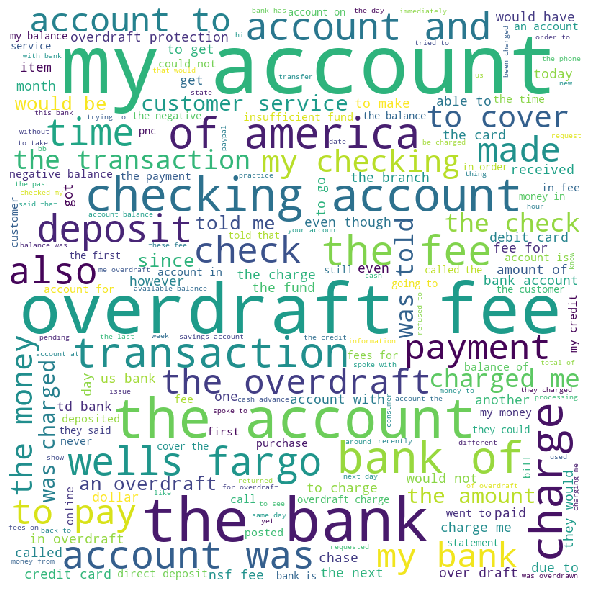

Cluster number: 18
hello re account i have called asked you people over times to change my due date and you still have not done it propery you keep sending me emails telling me i am past due what till it take for your incompetence to be corrected i really regret ever getting into bed with you and i can not wait to pay you off in full so i do n t ever have to deal with you again it was a mistake and i will never do business with conns change my due date to the of each month immediately 

cant ake any more scripts i asked for a time good will credit since i am a good customer and get nothing from this card never mind i need it and deserve it i am put on hold told no its pure greed and without loyalty i cant be loyal either that is business i wias put on hold and still declined what a message i will stick with who gives good will crediits to me ona regular basis since i am valued ther efor all the times i cant understand the person due to their and am put on hold for no reason i am enrage

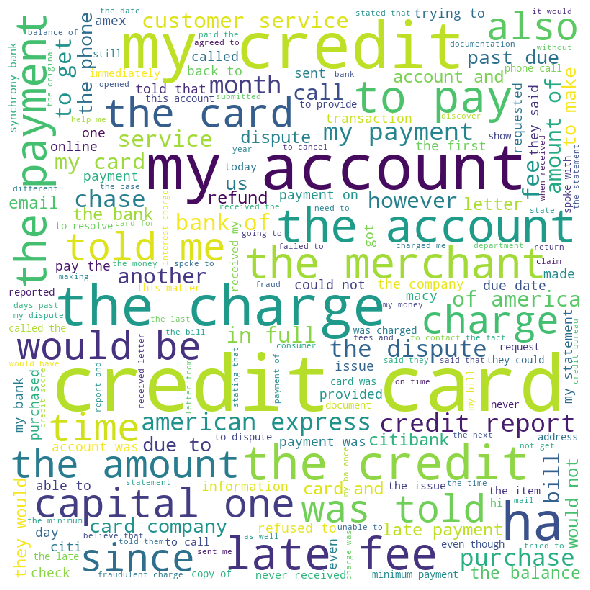

Cluster number: 19
they use terrible practices when trying to collect pass due payments you advise them about paying the past due amount and they tell you no you owe me double the amount but my next payment will not be due at that present time they leave unprofessional voice messages and threatening messages they sent emails to my job after i told them not to contact me at my job i choose not to speak them because they are not willing to help they have employees trying to hit there monthly numbers regardless what it takes i will seek an attorney for these unprofessional practices 

recently a person has been repeatedly calling my previous employer asking for any information pertaining to me they explain that they have a legal document to deliver and that they have called all my other previous employers and that they need to deliver the legal document and they need them to provide any information they have about me they have called daily next they called my mother and left a detailed vo

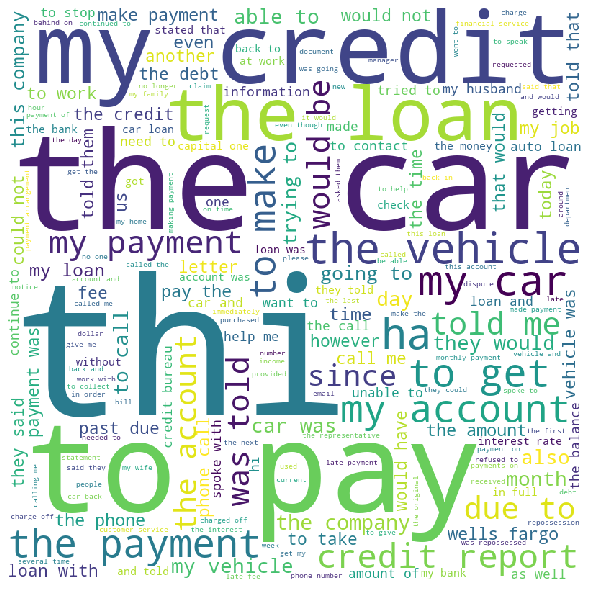

Cluster number: 20
unable to purchase goods online using paypal is the only allowed vehicle can not enter my credit card information without using this service they have a i have verified my information with paypal numerous times they still deny me 

Number of entries: 1051


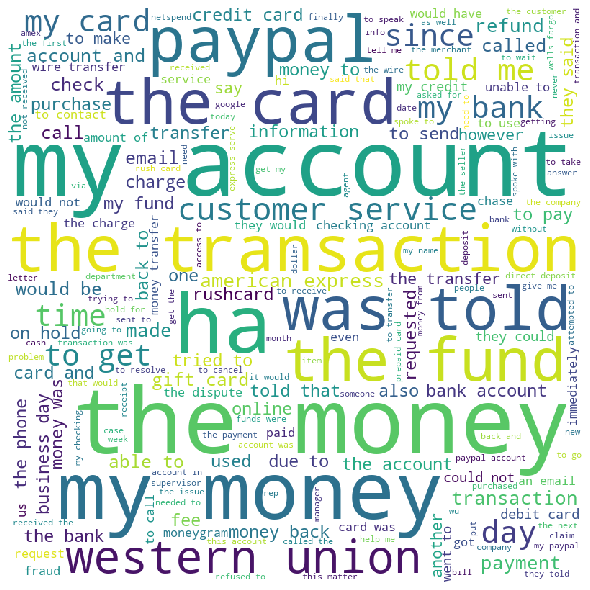

Cluster number: 21
hello i used western union wu pay service to send money to for emergency on i call wu on to see if they got money from my bank yet and they said due to technical issue so they have not received the money yet i called my bank company to check if my money has been sent to wu and i was told that money has sent to wu i called wu pay back and explained to them and was told to call back in to hours to check the status of the money i called them back daily after the and until the i got an email like this your payment was received on we sought the assistance of our escalations team to allocate your payment to the order we had a technical issue that was identified and in the process of fixing it we will notify you once response is receive we do apologize for the inconvenience i called them right after the email on the and was told my transaction has been cancelled and i will receive the refund within busniness days i questioned them why did not they notify me about the cancel

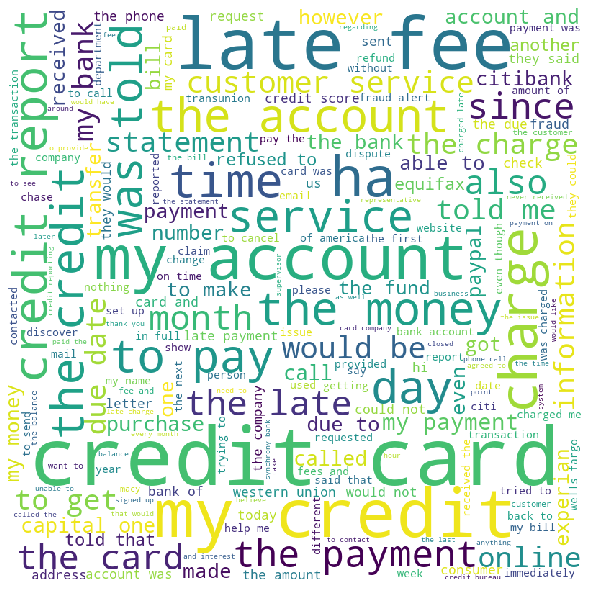

Cluster number: 22
today on i received an email stating that my american express serve account is being closed due to unusual usage patterns i have used serve with full intent to pay credit card bills water bills gas bills property tax school tax rent fees and other bills in fact the tax office is still waiting on the serve bill payments that i requested to be sent on by closing my account i will not have a way to pay my bills on time what i loved about serve was the ability to load money via credit card or debit card quickly and the funds would arrive immediately it was more convenient that the bank transfer method that takes several business days it was also more reliable than work there is no activity that is inconsistent with the intended use of the account serve has been so great to me as a servicemember and current american express cardholder i am often told that american express has our backs no matter the issue but this is not the case and this was a slap to the face to all of 

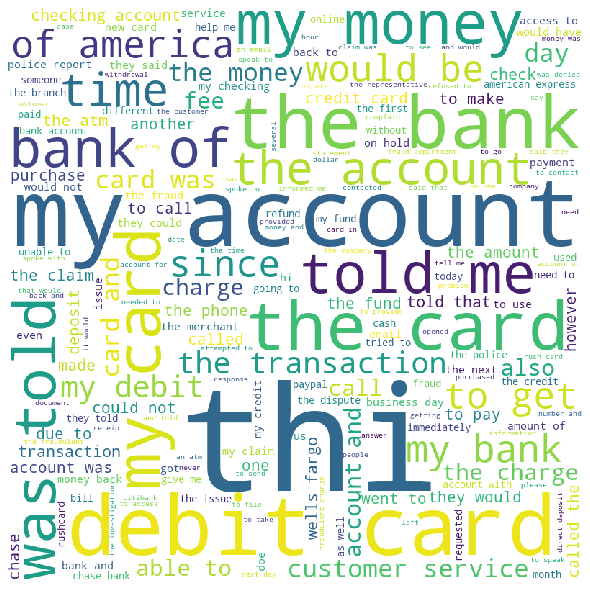

Cluster number: 23
i paid two weeks in advance after taking my daughter out of this in tx i have checks and bank transfer to prove it not they are trying to charge me for an additional two weeks even when my baby was n t there i do n t own any money and they threaten me with damage or reporting to the credit bureaus i have all the evidence and probes that i do n t own any money 

i did a payday loan and was told after the loan was in my account i would get charges interest rates everyday the loan accrued interest which sounds odd to me i was laid off and called the company my account was placed on hold until i went back to work and now i am getting threatening emails even with the account being noted it is on hold i received this tonight the loan was and i made payments of on the loanhello this is an urgent notice we have not received a payment on your past due account of we understand that complications arise and we are willing to negotiate a settlement for your overdue balance we hav

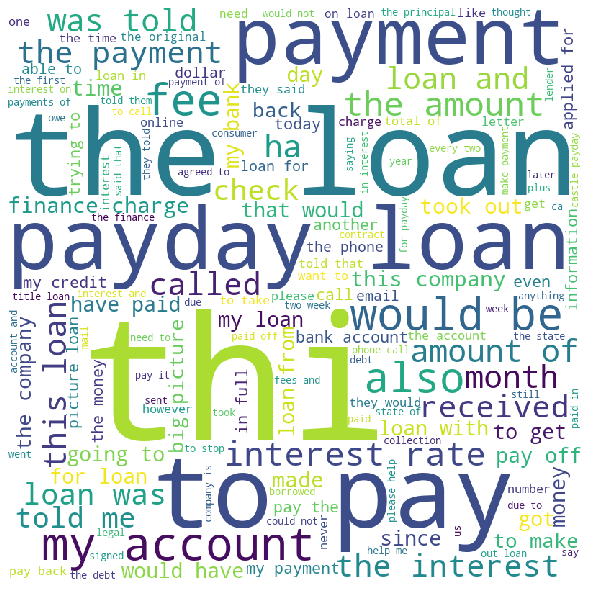

Cluster number: 24
our son was in an auto accident and was injured he now has very serious health problems he had a credit card he tried to pay it but it was sold to portfolio after filed for bankruptcy he continued to pay on it even though he continually explained his situation he was trying to get his life back and reestablish his credit rating and get any debts paid he was taken off of work for a period after the accident and they found more very severe health problems he had informed and portfolio in the last contact and it went ignored by them and they followed through on this default against him a person with very severe medical problems this past year he was served with a summons he did not understand what to do and kept paying the debt he paid them over out of good faith and agreed to pay his debt just wanted them to work with him he has paid and twice in of receiving letters of receipt back from portfolio thanking him for his payment he continually asked for the summons to be 

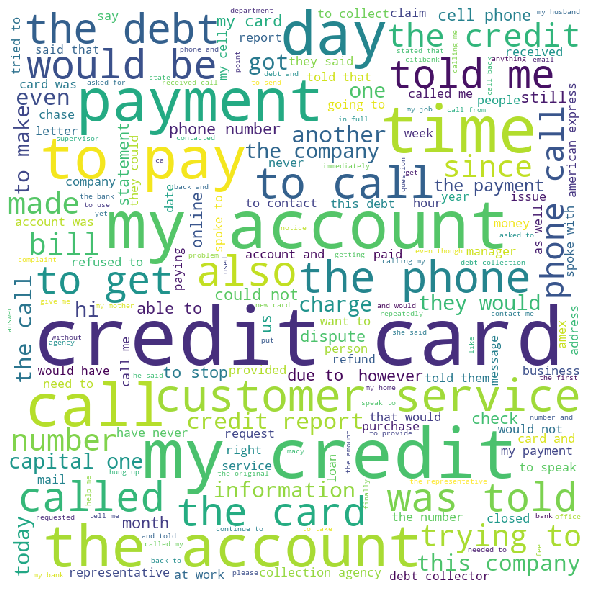

Cluster number: 25
i have had a best buy credit card with citibank for years i did fall behind but caught up and have been making monthly payments on this account trying to pay it off citibank continues to charge a annual fee and over the limit fees each month to my card i have called them and requested they cancel the card they are now calling me day and night not leaving messages just calling letting the answering machine catch the call then hang up sometimes times in a row this has become harassment they even call on sundays all day i was in a car accident in which left me i am still working as much as i can to pay off my bills but have missed a lot of time at work and therefore limited pay letter attached 

Number of entries: 472


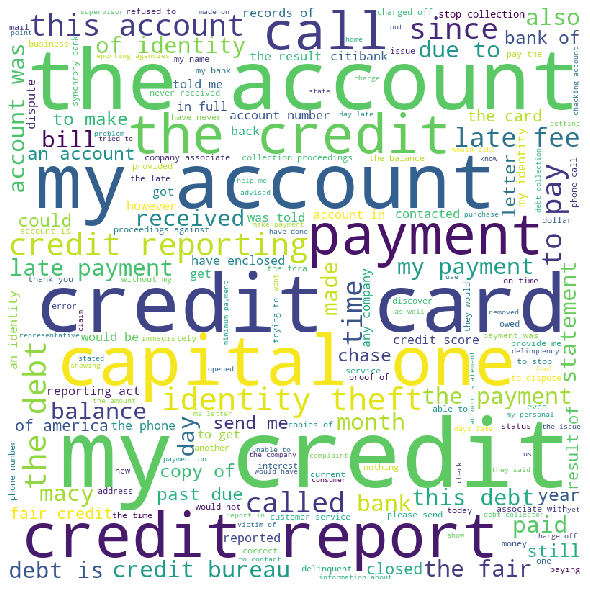

Cluster number: 26
i can not access my credit report electronically in any form meaning through equifax directly or any credit monitoring service equifax offered to send me a paper copy but did not fix the fact that i can not access my report electronically nor can some creditors i have a right to be able to access my credit report electronically equifax must fix this i ca n t monitor my credit if they do n t which causes me substantial harm 

i first started with annual credit report website for copies of my credit report i receive out of agency with no problem equifax stated online they can not find the report and need more information in hard copy i email social security card and bill with address as requested equifax send back same letter requesting the documents more time with me sending them three more time last time i add the information to the certified mail and letter ask they need any other information but with no response beside the same letter asking for the hard copies tha

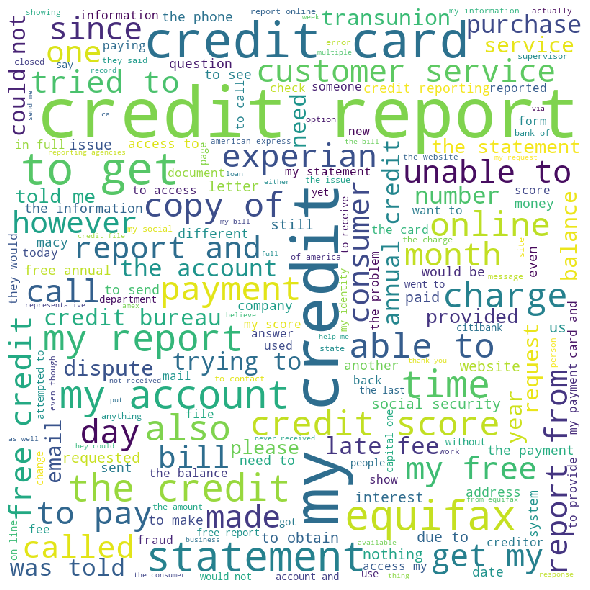

Cluster number: 27
i was gifted with a prepaid debit mastercard from around year ago i did not use the complete funds before the expiration date and when i requested a new card be submitted i was told the card was expired and the remaining was forfeited i told them exactly what the consumer financial bureau says on it s website if you have a prepaid debit card and the card expires while you still have money on it you can request a replacement card to access the funds the funds on a gift card will be good for at least five years even if the physical card expires at an earlier time if your card expires and there are unspent funds on it that have not expired the issuer may give you a replacement card or give you the money by another means such as a check either way they may not charge you a fee the agent i was speaking to agent id responded that this was not a gift card but an incentive card and therefor did not fall under the gift card law but that is exactly what an incentive card is a 

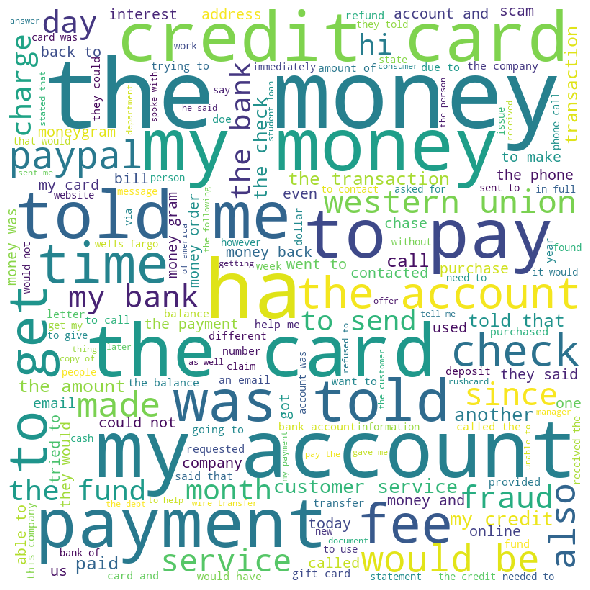

Cluster number: 28
in i opened a credit account with jared the galleria of jewelry i went to the store on in mi the card is through sterling jewelers i was told by the associates who helped there were different employees assisting me that day that if i opened the account it would have apr for the first months so i purchased my engagement ring and wedding bands with service plans for about my first statement had no interest charges however my and statements applied a apr i called the phone number on my statement and was told that customers have to make a down payment to get the apr for months however this was never told to me in the store when they sold me the credit account and jewelry i was told i can have the apr but i have to make more than a payment to have it i feel as though i was deceived into applying for a line of credit without being provided all of the information i would not have opened the account or purchased anything from them if that was the case their return policy is 

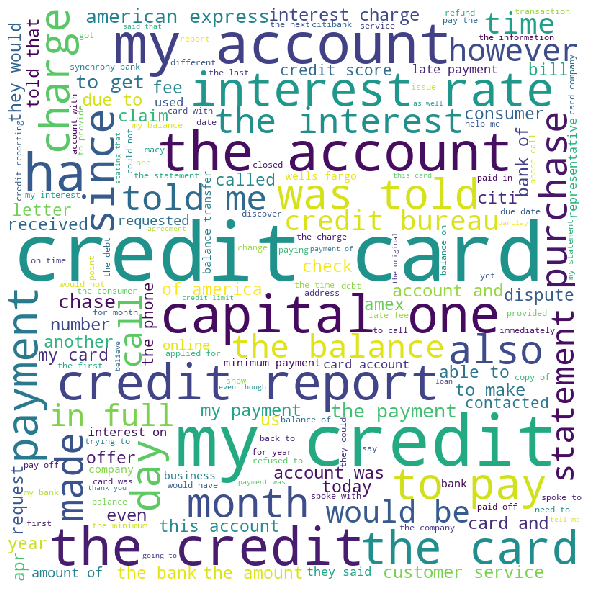

Cluster number: 29
Number of entries: 696


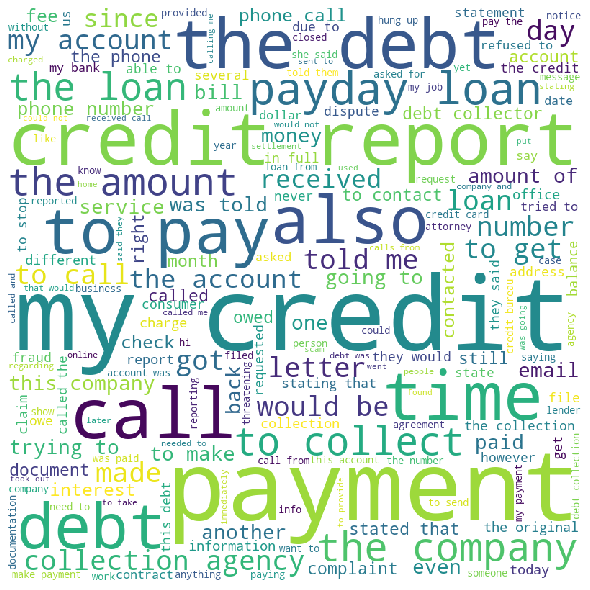

Cluster number: 30
i placed in my bank of america credit card account bank of america reduced my credit limit by and took of the fr from my account the was an attempt to lower the admittedly high balance and to begin resurrecting my credit not only is appropriating the funds unfair but it serves to further unsettle my credit standing furthermore i am in fear that boa may take money from checking account i can not even close the account without realizing further credit penalties boa is my longest opened account finally the credit report used was based upon inaccurate information however if it were accurate lowering the credit limit and then appropriating funds can not be an ethical even if legal practice please return the i do not care if the credit limit is lowered in fact that would mean smaller monthly payments i am employed and i receive social security i work hard to maintain my credit this action only serves to undermine my financial health and efforts to demonstrate credit worthi

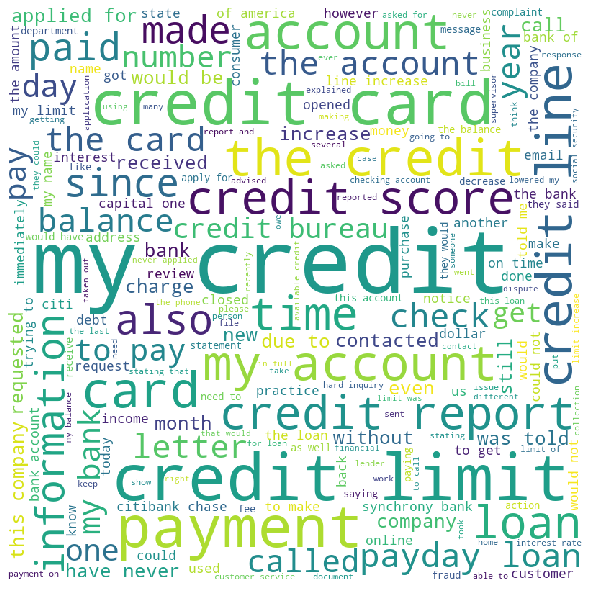

Cluster number: 31
opened card at banana republic wanted to pay it off next day website was very difficult was told by rude representative that card will not be delivered for seven business days and that i ca n t make payment without incurring a fee for a bill before getting my card i will be traveling for the next month at which point i will be in delinquency status so i d like to get this done now only there is no way to do it that seems quite ridiculous and unfair 

Number of entries: 758


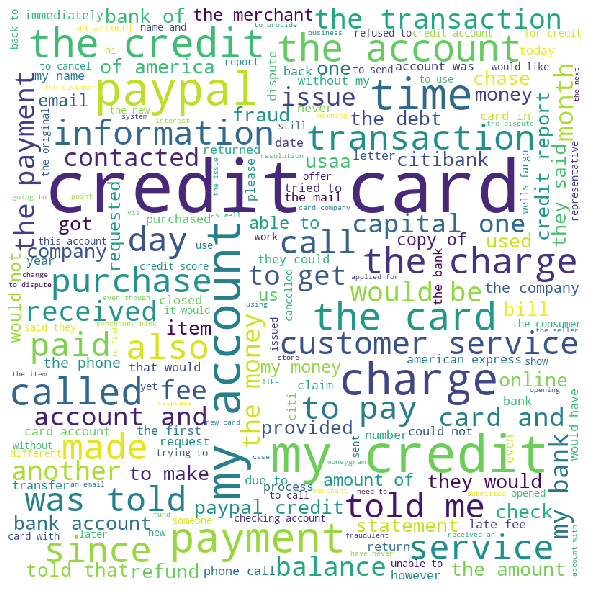

Cluster number: 32
i am the author and owner of all communications withing this complaint i do not agree to allow this complaint to be managed outside of the portal my credit report currently has reporting inaccurately and in an incorrect manner i dispute the validity of this accounttradeline the type of account says na and should be revolvingoption there is no payment history in this account and there should be as this account was opened for over years there is no balance history in this account and there should be as this account was opened for over years because this account has no payment history please verify its statusmajor delinquency date because this account has no balance history please verify its statusmajor delinquency date this account has no activity designator and should as this account is closed please validate this tradeline and resolve the errors or delete this account please provide a printed report when resolved 

this account from is closed and i no longer them owe

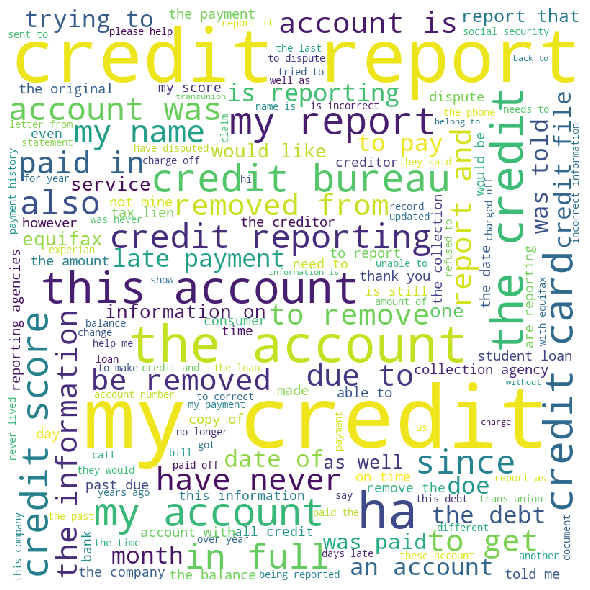

Cluster number: 33
macy s dsnb has deleted a payment history on all credit bureaus even though there would have been one as far back as they state that the first delinquency was whereas the drop off date for removal with all pertinent credit reporting agencies would be the account was discharged from a chapter bankruptcy petition however there are ten years of payment history deleted from the credit bureau and i make a claim that i was at least days late several times before the inserted accordingly i believe that i am well within the year rule timeline for the removal of obsolete information and the account should be deleted immediately and permanently delete this credit item 

Number of entries: 579


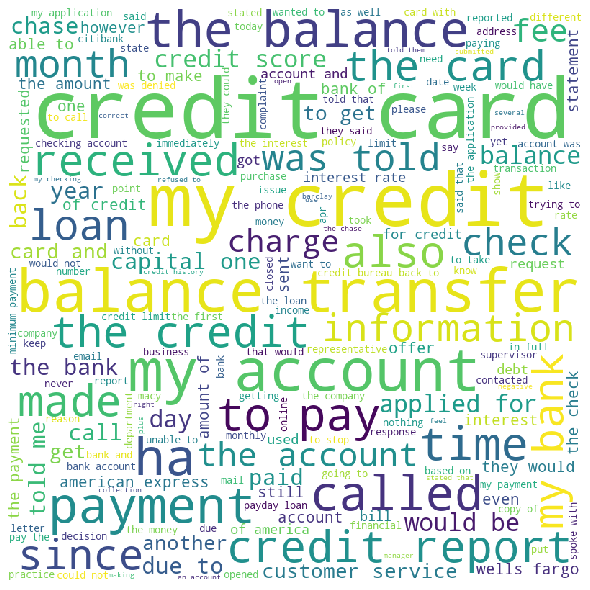

Cluster number: 34
Number of entries: 767


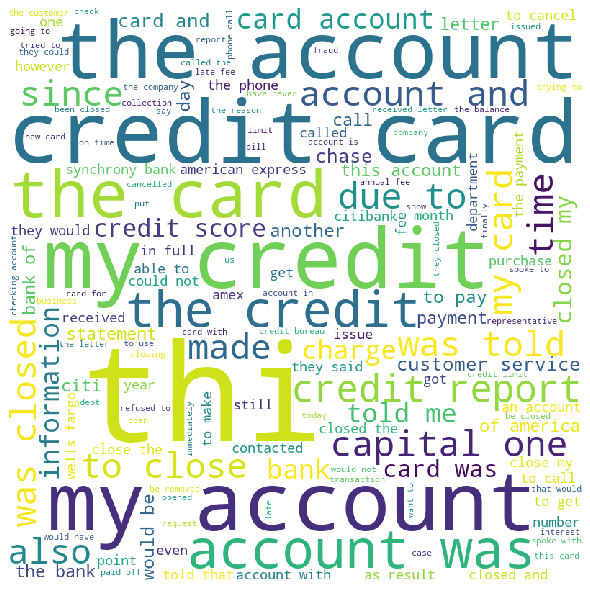

Cluster number: 35
Number of entries: 430


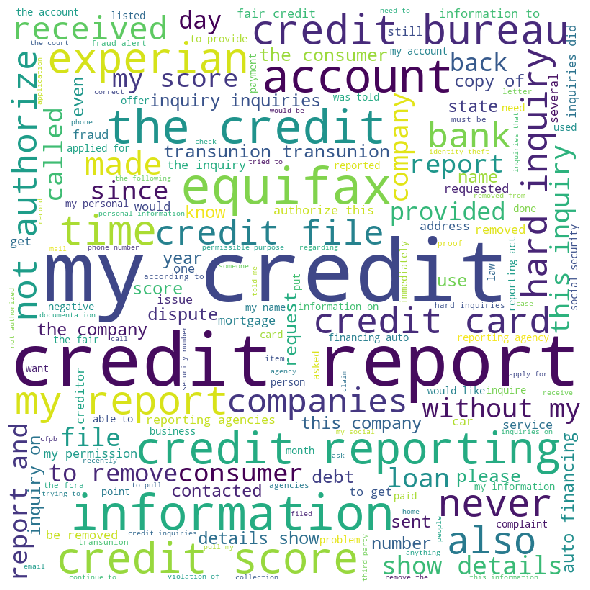

Cluster number: 36
Number of entries: 732


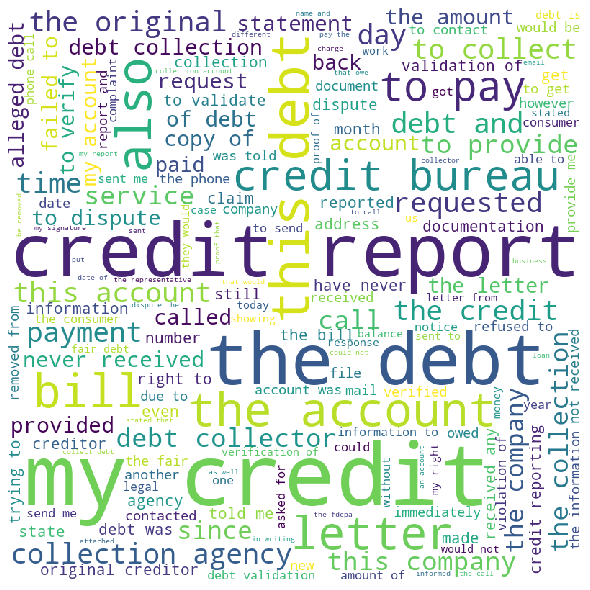

In [14]:
from wordcloud import WordCloud
import nltk
from nltk.corpus import stopwords
import random

#if it's your first time running with these stopwords, run the following line aswell:
#nltk.download('stopwords')

stopwords = set(stopwords.words('english'))
stopwords.add('xx')
stopwords.add('wa')

for i in range(0,number_clusters):
    all_words = ''
    print('Cluster number: '+str(i))
    amount = 0
    for index, row in df_result.iterrows():
        if row[0] == i:
            all_words += ' ' + row['Consumer complaint narrative']
            rand = random.randint(1,700)
            amount += 1
            if(rand == 1):
                print(row['Consumer complaint narrative'] + '\n')
    wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', 
                stopwords = stopwords, 
                min_font_size = 10).generate(all_words) 
    print('Number of entries: ' + str(amount))
    plt.figure(figsize = (8, 8), facecolor = None) 
    plt.imshow(wordcloud) 
    plt.axis("off") 
    plt.tight_layout(pad = 0) 
    plt.show() 


## Visualizing clusters

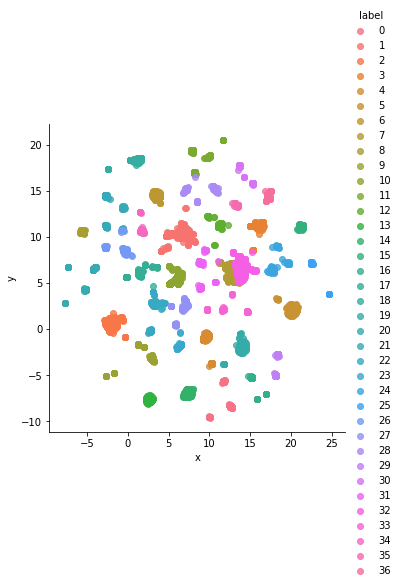

In [15]:
import seaborn as sns
_labels = pd.DataFrame(indexes)
labels = _labels.rename(columns={0: 'label'}) 

_reduced = pd.DataFrame(data_reduced)
reduced = _reduced.rename(columns={0: 'x', 1: 'y'}) 

clusters = pd.concat([reduced, labels], axis = 1)


facet = sns.lmplot(data=clusters, x='x', y='y', hue='label', 
                   fit_reg=False, legend=True, legend_out=True)
